<a href="https://colab.research.google.com/github/nirmit10000/Spotify_Song_Popularity_Prediction/blob/main/song_popularity_prediction_spotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Installing python packages, importing libraries and utilities

INSTALLING PYTHON PACKAGES




In [ ]:

!pip install xgboost
!pip install scikit-learn
! pip install pandas pandas-profiling
! pip install xgboost scikit-learn


  Using cached joblib-1.1.1-py2.py3-none-any.whl.metadata (5.2 kB)
Using cached joblib-1.1.1-py2.py3-none-any.whl (309 kB)
  Attempting uninstall: joblib
    Found existing installation: joblib 1.4.2
    Uninstalling joblib-1.4.2:
      Successfully uninstalled joblib-1.4.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.15.0 requires visions[type_image_path]<0.8.2,>=0.7.5, but you have visions 0.7.4 which is incompatible.
scikit-learn 1.6.1 requires joblib>=1.2.0, but you have joblib 1.1.1 which is incompatible.
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.1
    Uninstalling joblib-1.1.1:
      Successfully uninstalled joblib-1.1.1
ERROR: pip's dependency resolver does not currently take into account

In [ ]:
!pip install ydata-profiling

  Using cached visions-0.8.1-py3-none-any.whl.metadata (11 kB)
Using cached visions-0.8.1-py3-none-any.whl (105 kB)
  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires joblib~=1.1.0, but you have joblib 1.4.2 which is incompatible.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.8.1 which is incompatible.


IMPORTING PYTHON LIBRARIES

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.graph_objects as go
from ydata_profiling import ProfileReport



IMPORTING scikit-learn UTILITIES

In [ ]:
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

#Importing pre-built regression_models

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor

#Importing pre-built classification_models

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB, ComplementNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier


#importing LeakyReLU as an alternate activation function
from tensorflow.keras.layers import LeakyReLU

#Importing the metrics to evaluate and optimise the models

In [ ]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, precision_recall_curve

In [ ]:
sc = StandardScaler()

#Importing the data, data preprocessing and EDA

IMPORTING THE DATASET

In [ ]:
df = pd.read_csv('spotify_pop_index.csv', encoding = 'latin-1')

DATA PREPROCESSING and EDA

In [ ]:
df.head(5)

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,15
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,56
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


In [ ]:
df.shape

(130663, 17)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130663 entries, 0 to 130662
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist_name       130663 non-null  object 
 1   track_id          130663 non-null  object 
 2   track_name        130662 non-null  object 
 3   acousticness      130663 non-null  float64
 4   danceability      130663 non-null  float64
 5   duration_ms       130663 non-null  int64  
 6   energy            130663 non-null  float64
 7   instrumentalness  130663 non-null  float64
 8   key               130663 non-null  int64  
 9   liveness          130663 non-null  float64
 10  loudness          130663 non-null  float64
 11  mode              130663 non-null  int64  
 12  speechiness       130663 non-null  float64
 13  tempo             130663 non-null  float64
 14  time_signature    130663 non-null  int64  
 15  valence           130663 non-null  float64
 16  popularity        13

In [ ]:
df.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
count,130663.000000,130663.000000,1.306630e+05,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000
mean,0.342500,0.581468,2.126331e+05,0.569196,0.224018,5.231894,0.194886,-9.974006,0.607739,0.112015,119.473353,3.878986,0.439630,24.208988
std,0.345641,0.190077,1.231551e+05,0.260312,0.360328,3.602701,0.167733,6.544379,0.488256,0.124327,30.159636,0.514403,0.259079,19.713191
min,0.000000,0.000000,3.203000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.031600,0.459000,1.639225e+05,0.396000,0.000000,2.000000,0.097500,-11.898000,0.000000,0.038900,96.014000,4.000000,0.224000,7.000000
50%,0.203000,0.605000,2.019010e+05,0.603000,0.000149,5.000000,0.124000,-7.979000,1.000000,0.055900,120.027000,4.000000,0.420000,22.000000
75%,0.636000,0.727000,2.410475e+05,0.775000,0.440000,8.000000,0.236000,-5.684000,1.000000,0.129000,139.642000,4.000000,0.638000,38.000000
max,0.996000,0.996000,5.610020e+06,1.000000,1.000000,11.000000,0.999000,1.806000,1.000000,0.966000,249.983000,5.000000,1.000000,100.000000


In [ ]:
df.isnull().sum()

,0
artist_name,0
track_id,0
track_name,1
acousticness,0
danceability,0
duration_ms,0
energy,0
instrumentalness,0
key,0
liveness,0


In [ ]:
df.nunique()

,0
artist_name,34507
track_id,130326
track_name,108332
acousticness,4908
danceability,1257
duration_ms,77897
energy,2571
instrumentalness,5387
key,12
liveness,1717


In [ ]:
df.columns

Index(['artist_name', 'track_id', 'track_name', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence',
       'popularity'],
      dtype='object')

In [ ]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:15<00:00,  1.12it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0, 0.5, 'Frequency')

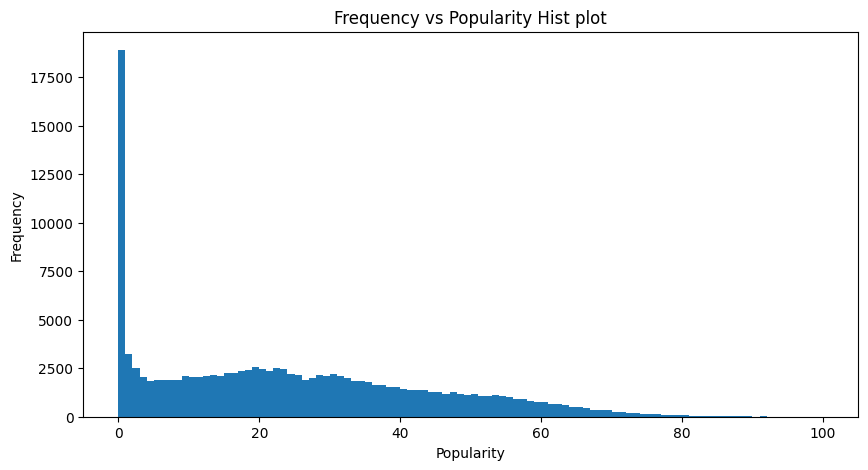

In [ ]:
plt.figure(figsize = (10,5))
df['popularity'].plot(kind = 'hist', bins = 100)

plt.title('Frequency vs Popularity Hist plot')
plt.xlabel('Popularity')
plt.ylabel('Frequency')

Text(0, 0.5, 'Density fraction')

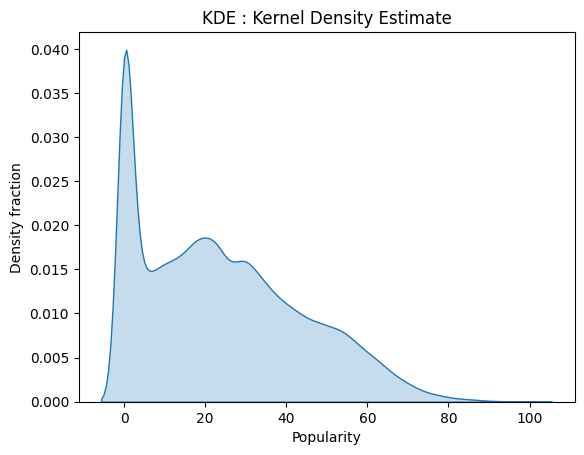

In [ ]:
sns.kdeplot(df['popularity'], shade = True)

plt.title('KDE : Kernel Density Estimate')
plt.xlabel('Popularity')
plt.ylabel('Density fraction')


Text(0.5, 0, 'Popularity')

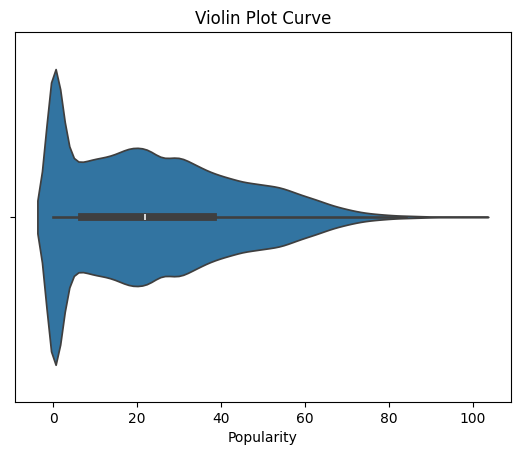

In [ ]:
sns.violinplot(x=df['popularity'])

plt.title('Violin Plot Curve')
plt.xlabel('Popularity')


Text(0, 0.5, 'Frequency')

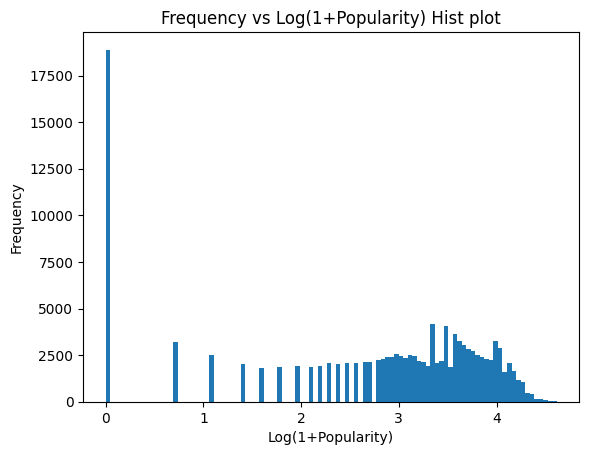

In [ ]:
np.log1p(df['popularity']).plot(kind='hist', bins=100)

plt.title('Frequency vs Log(1+Popularity) Hist plot')
plt.xlabel('Log(1+Popularity)')
plt.ylabel('Frequency')


#To counter the heavy skewness in the dataset, we use Logarithmic distribution

Text(0, 0.5, 'Cumulative Fraction')

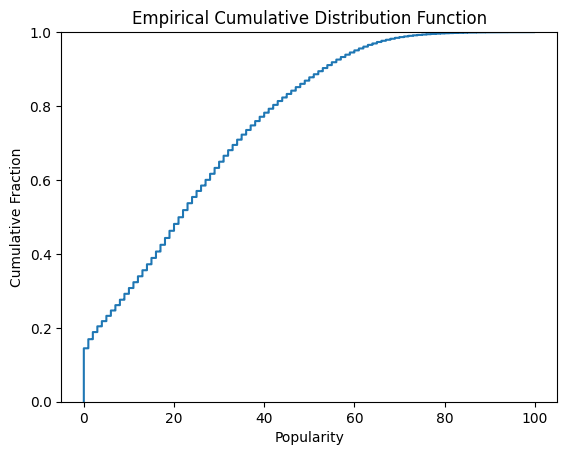

In [ ]:
sns.ecdfplot(df['popularity'])

plt.title('Empirical Cumulative Distribution Function')
plt.xlabel('Popularity')
plt.ylabel('Cumulative Fraction')

#To counter the heavy skewness in the dataset, we use Logarithmic distribution

Text(0, 0.5, 'Frequency')

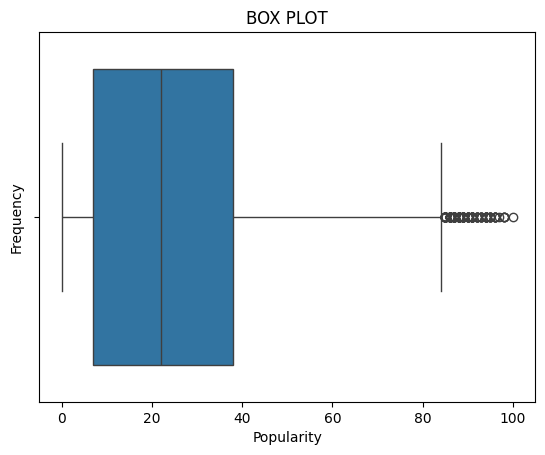

In [ ]:
sns.boxplot(x=df['popularity'])

plt.title('BOX PLOT')
plt.xlabel('Popularity')
plt.ylabel('Frequency')



In [ ]:
#from the above graphs and plots,
#it's evidently clear that the  DISTRIBUTION OF TARGET VALUES IS SKEWED,
#leading to data_imbalance

In [ ]:
col_to_be_dropped = ['artist_name', 'track_name', 'track_id']
df.drop(col_to_be_dropped, axis = 1, inplace = True)

In [ ]:
df.sample()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
50788,0.453,0.525,205875,0.332,0.0,0,0.123,-8.561,1,0.0584,158.913,4,0.582,0


OBTAINING CORRELATION MATRIX AND HEATMAP

In [ ]:
df.corr()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
acousticness,1.000000,-0.360462,0.033426,-0.710067,0.272685,-0.019987,-0.100545,-0.603366,0.067171,-0.119231,-0.216328,-0.165319,-0.177023,-0.116520
danceability,-0.360462,1.000000,-0.126781,0.286196,-0.305112,0.021123,-0.137377,0.431554,-0.057912,0.248192,0.081791,0.206328,0.461468,0.131086
duration_ms,0.033426,-0.126781,1.000000,-0.019885,0.029124,-0.001880,-0.003661,-0.018595,0.010321,-0.101955,-0.009657,0.021007,-0.141837,-0.000801
energy,-0.710067,0.286196,-0.019885,1.000000,-0.301308,0.039843,0.209448,0.766697,-0.069263,0.105078,0.229930,0.165030,0.314768,0.122506
instrumentalness,0.272685,-0.305112,0.029124,-0.301308,1.000000,-0.025072,-0.058390,-0.508519,-0.002211,-0.217359,-0.086894,-0.084223,-0.246869,-0.216447
key,-0.019987,0.021123,-0.001880,0.039843,-0.025072,1.000000,0.009191,0.028101,-0.176238,0.010354,0.005464,0.008878,0.043348,0.002682
liveness,-0.100545,-0.137377,-0.003661,0.209448,-0.058390,0.009191,1.000000,0.062168,-0.001325,0.106801,-0.009126,-0.018307,-0.007800,-0.031174
loudness,-0.603366,0.431554,-0.018595,0.766697,-0.508519,0.028101,0.062168,1.000000,-0.036081,0.074456,0.223067,0.179679,0.319881,0.244088
mode,0.067171,-0.057912,0.010321,-0.069263,-0.002211,-0.176238,-0.001325,-0.036081,1.000000,-0.053554,-0.000249,-0.036244,0.011082,-0.009070
speechiness,-0.119231,0.248192,-0.101955,0.105078,-0.217359,0.010354,0.106801,0.074456,-0.053554,1.000000,0.054827,0.053707,0.121552,-0.000214


Text(95.58159722222221, 0.5, 'Features')

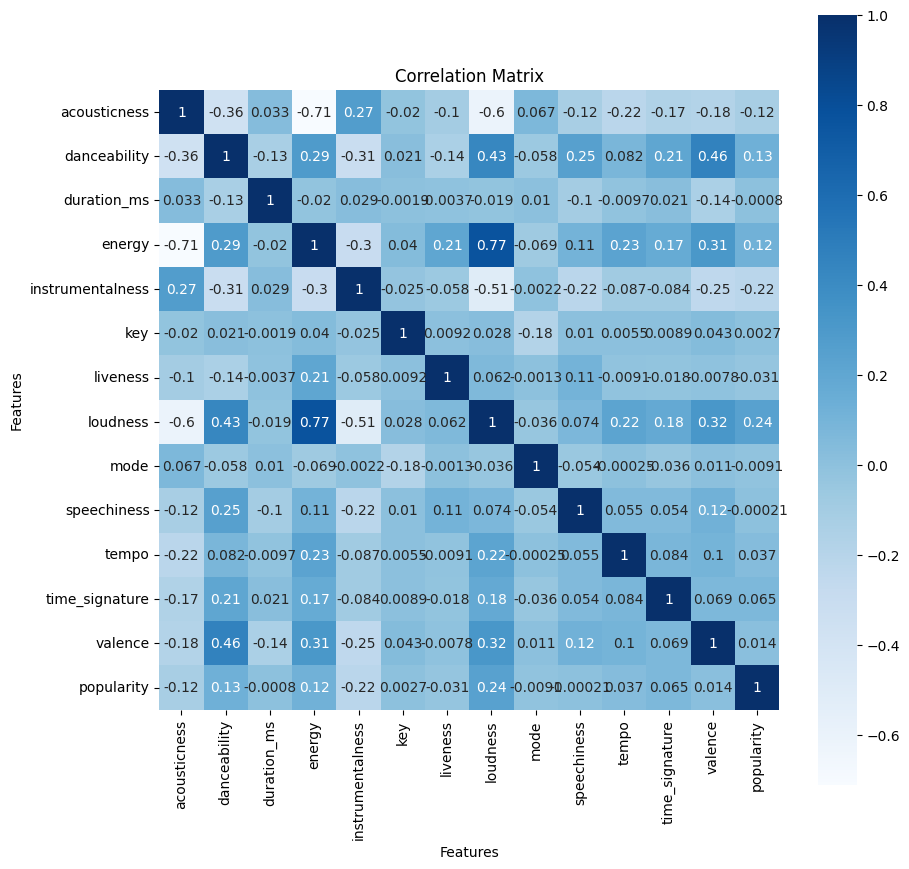

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(), square = True,annot = True, cmap='Blues')

plt.title('Correlation Matrix')
plt.xlabel('Features')
plt.ylabel('Features')


In [ ]:
#From the Heatmap, we see maximum correlation of Popularity with 'Loudness and Instrumentalness'

#Analysing the dependence, variation, correlation and density of Loudness with target : Popularity

Text(0, 0.5, 'Loudness')

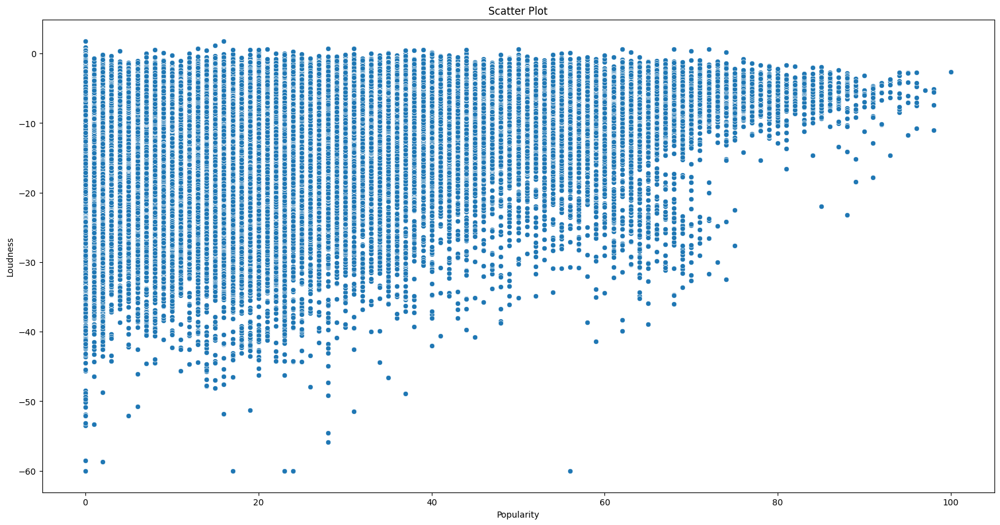

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = df['popularity'], y = df['loudness'] , hue=None)

plt.title('Scatter Plot')
plt.xlabel('Popularity')
plt.ylabel('Loudness')

Text(0, 0.5, 'Loudness')

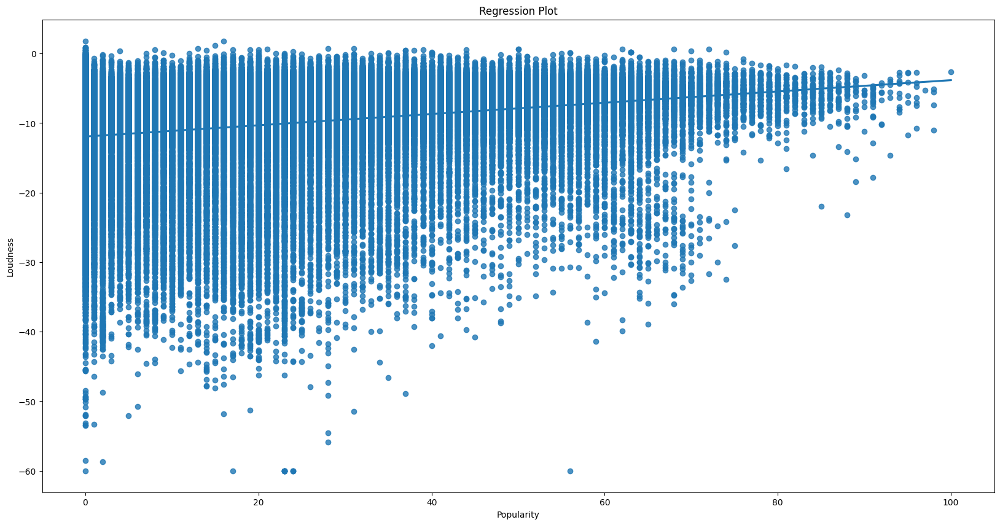

In [ ]:
plt.figure(figsize=(20,10))
sns.regplot(x='popularity', y='loudness', data=df)

plt.title('Regression Plot')
plt.xlabel('Popularity')
plt.ylabel('Loudness')


Analysing the dependence, variation, correlation and density of Instrumentalness with target : Popularity

Text(0, 0.5, 'Instrumentalness')

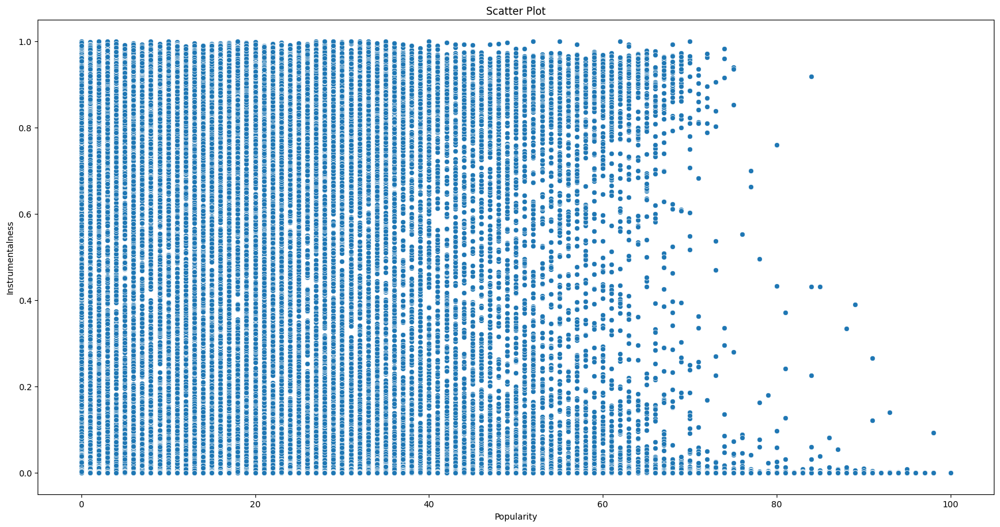

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = df['popularity'], y = df['instrumentalness'] , hue=None)

plt.title('Scatter Plot')
plt.xlabel('Popularity')
plt.ylabel('Instrumentalness')

Text(0, 0.5, 'Instrumentalness')

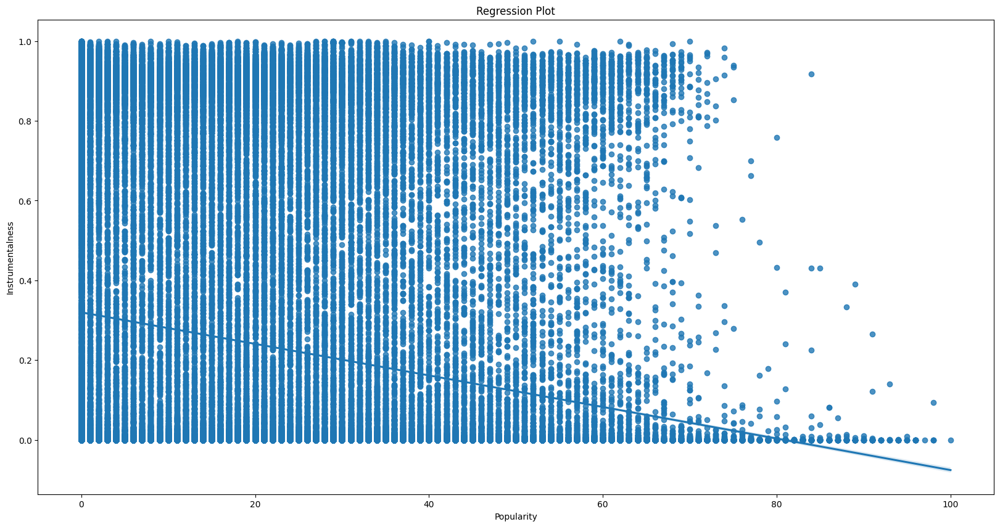

In [ ]:
plt.figure(figsize=(20,10))
sns.regplot(x='popularity', y='instrumentalness', data=df)

plt.title('Regression Plot')
plt.xlabel('Popularity')
plt.ylabel('Instrumentalness')

#REGRESSION

#Implementing the classical_regression_models

In [ ]:
#splitting the datasets

x = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

#implementing the train_test_split
#test_size set at a standar_val of 0.2

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2, random_state = 65)

Obtaining the CROSS_VALUE_CROSS of the Linear_Regression model

In [ ]:
np.mean(cross_val_score(LinearRegression(),x_train,y_train,cv = 10))

np.float64(0.08581036076310695)

In [ ]:
# Not training SVR (linear & RBF), DTR, RFR, and KNN due to high model complexity.
# Complexity order:

# - KNN: O(n²) (distance computation for all points)
# - SVR (RBF): O(n³) (kernel computation & optimization)
# - SVR (Linear): O(n²) (quadratic optimization problem)
# - RFR: O(trees *f eatures * n log n) (building multiple trees)
# - DTR: O(n log n) (building a single tree)

# (Detailed explanation provided in the final report.)


Obtaining the best 'ALPHA' value for Ridge_Regression

In [ ]:
#standardising the inputs_ for regression_models

x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [ ]:
ridge_reg = Ridge()
value_of_alphas_to_be_deployed = [0.001,0.01,0.1,1.0,10,100,500,1000]
param_grid = { 'alpha': value_of_alphas_to_be_deployed}
ridge_cv = GridSearchCV(ridge_reg, param_grid, cv=6)
#x_reg_train = sc.fit_transform(x_train)
#x_reg_test = sc.transform(x_test)
ridge_cv.fit(x_train, y_train)
print(ridge_cv.best_params_)
print(ridge_cv.best_score_)


{'alpha': 100}
0.085877731307479


In [ ]:
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression (α=1.0)": Ridge(alpha=1.0),

    "Ridge Regression (α=ridge_cv.best_params_)": Ridge(alpha=ridge_cv.best_params_['alpha']),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, verbosity=0),
    "AdaBoost": AdaBoostRegressor(n_estimators=100, learning_rate=0.1), #also taking lots of time to run
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3) #(taking lots of time to run)
}


#Evaluating the classical_regression_models on metrics like R2_SCORE, MAE and MSE

In [ ]:
results = {}

for name, model in models.items():

    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store results

    results[name] = {"MSE": mse, "MAE": mae, "R2 Score": r2}

In [ ]:
# Convert results to a DataFrame for better readability

results_df = pd.DataFrame(results).T
print("\nModel Performance:\n", results_df)


Model Performance:
                                                    MSE        MAE  R2 Score
Linear Regression                           355.018002  15.547299  0.090183
Ridge Regression (α=1.0)                    355.018033  15.547302  0.090183
Ridge Regression (α=ridge_cv.best_params_)  355.021186  15.547522  0.090175
XGBoost                                     333.827484  14.990844  0.144489
AdaBoost                                    358.389974  15.860929  0.081542
Gradient Boosting                           333.908331  14.992583  0.144281


In [ ]:
# The performance of traditional regression models (Linear, Ridge, XGBoost, etc.)
# remains suboptimal, as indicated by low R² scores and minimal improvements across models.

# This suggests that the underlying patterns in the data may be too complex for these models
# to capture effectively. We now transition to an Artificial Neural Network (ANN) approach.


In [ ]:
# MAE (~15) suggests an average deviation of 15 points in popularity index (0-100 scale)
# MSE > MAE² indicates significant variance in errors, implying large deviations exist

# - ANNs capture non-linearity & feature interactions better
# - More adaptable to high-dimensional data & outliers
# - Requires careful tuning (e.g., architecture, regularization) to prevent overfitting


#Implementing regression using Artificial Neural Networks

Training the ANN on the dataset

In [ ]:
# Initializing a sequential model
ann_reg = tf.keras.models.Sequential()

ann_reg.add(tf.keras.layers.Dense(units=64, activation='relu'))  # First hidden layer with 64 neurons and ReLU activation
ann_reg.add(tf.keras.layers.BatchNormalization())  # Normalizing activations to stabilize and speed up training
ann_reg.add(tf.keras.layers.Dropout(0.2))  # Dropout layer to reduce overfitting by randomly setting 20% of neurons to zero


#Adding subsequent layers
ann_reg.add(tf.keras.layers.Dense(units=32, activation='relu'))
ann_reg.add(tf.keras.layers.Dense(units=16, activation='relu'))
ann_reg.add(tf.keras.layers.Dense(units=8, activation='relu'))

 # Output layer for regression (linear activation)
ann_reg.add(tf.keras.layers.Dense(units=1, activation='linear'))

# AdamW optimizer with weight decay for better generalization
optimizer_used = tf.keras.optimizers.AdamW(learning_rate=0.0005, weight_decay=1e-4)


ann_reg.compile(optimizer=optimizer_used, loss=tf.keras.losses.Huber(delta=1.0))  # Compiling model with Huber_loss


ann_reg.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))
# Training the model with a batch size of 128 for 50 epochs, using validation data for monitoring performance


Epoch 1/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 18.9693 - val_loss: 14.5435
Epoch 2/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 14.7268 - val_loss: 14.4304
Epoch 3/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 14.5208 - val_loss: 14.3802
Epoch 4/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 14.4746 - val_loss: 14.3274
Epoch 5/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 14.4166 - val_loss: 14.2967
Epoch 6/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 14.3472 - val_loss: 14.2925
Epoch 7/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 14.4007 - val_loss: 14.2581
Epoch 8/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 14.2920 - val_loss: 14.2529
Epoch 9/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 14.2727 - val_loss: 14.2346
Epoch 10/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 14.2289 - val_loss: 14.2252
Epoch 11/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 14.2495 - val_loss: 14.2198
Epoch 12/50
817/817 ━━━━━━━━━━

#Evaluating the ANN_regression_model on metrics like MSE, MAE AND R2_SCORE

In [ ]:
ann_metrics = {
    "MSE": mean_squared_error(y_test, ann_reg.predict(x_test)),
    "MAE": mean_absolute_error(y_test, ann_reg.predict(x_test)),
    "R2 Score" :r2_score(y_test, ann_reg.predict(x_test))
}
# Convert ann_metrics to a DataFrame
ann_metrics_df = pd.DataFrame([ann_metrics], index=['ANN'])

print("ANN Metrics:\n", ann_metrics_df)

817/817 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
817/817 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
ANN Metrics:
             MSE        MAE  R2 Score
ANN  335.363495  14.568705  0.140552


Comparing the performance of classical_regression_models with ANN

In [ ]:
# Concatenate the DataFrames
results_df = pd.concat([results_df, ann_metrics_df])
print( results_df)

                                                   MSE        MAE  R2 Score
Linear Regression                           355.018002  15.547299  0.090183
Ridge Regression (α=1.0)                    355.018033  15.547302  0.090183
Ridge Regression (α=ridge_cv.best_params_)  355.021186  15.547522  0.090175
XGBoost                                     333.827484  14.990844  0.144489
AdaBoost                                    358.389974  15.860929  0.081542
Gradient Boosting                           333.908331  14.992583  0.144281
ANN                                         335.363495  14.568705  0.140552


In [ ]:
# ANN marginally outperforms classical models, showing slight improvements in MSE, MAE, and R2 Score.
# However, the gains are insufficient, suggesting limitations in purely regression-based modeling.

# Next, we attempt a CLASSIFICATION approach to better capture the target distribution.


#CLASSIFICATION

#Importing and preprocessing the data for Classification purposes

In [ ]:
df = pd.read_csv('spotify_pop_index.csv', encoding ='latin-1')
col_to_be_dropped = ['artist_name','track_name', 'track_id']
df.drop(col_to_be_dropped, axis = 1, inplace = True)

In [ ]:
df = pd.read_csv('spotify_pop_index.csv', encoding='latin-1', on_bad_lines='skip') # or on_bad_lines='warn'
col_to_be_dropped = ['artist_name', 'track_name', 'track_id']
df.drop(col_to_be_dropped, axis=1, inplace=True)

In [ ]:
df.sample()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
106825,0.499,0.748,242353,0.556,0.0,2,0.223,-5.841,1,0.0823,101.967,4,0.607,0


#Feature Engineering : Quantile binning approach
(Read comments for better understading of why this approach was chosen)

In [ ]:
# The task is to predict song popularity, where regression models didn’t produce promising results.

# Given the dataset's HIGH IMBALANCE (majority of the Popularity_value skewed towards 0/ Lower values),
#an initial attempt was made with multi-class classification using not just a 2-bin approach but also 3-bin approach,
# where the target column was split into bins based on quantile percentiles.

#This approach was tested with different binning strategies, splitting the target_col into quantile based bins.
#While metrics were recorded, they weren’t promising and failed to capture the imbalanced nature effectively.

# Consequently, a binary classification model was adopted.
#The final model classifies songs as 'popular' (above the 99th percentile) or 'unpopular' (below).

# This approach aligns with real-world distribution, where only a small fraction (around 0.1% to 0.5%) of songs hit high popularity thresholds
# (sources regarding the 'percentage_of_song_that_actually_end_up_being_popular' will be mentioned in the FINAL REPORT)


# The three-bin and multi-bin approaches will be discussed further in the FINAL REPORT.


Obtaining the Optimum number of bins when the 'DATA IS NOT IMBALANCED'
(Not useful in our case, reason being : imbalanced dataset)

In [ ]:

#import numpy as np
N = 104530
q90, q10 = np.percentile(y_train, [90 ,10])
iqr = q90 - q10
bin_width = 2 * iqr * (N ** (-1/3))
num_bins = int((y_train.max() - y_train.min()) / bin_width)

print("Optimal number of bins:", num_bins)


Optimal number of bins: 43


In [ ]:
import numpy as np

y_train_log = np.log1p(y_train)  # log(1 + y) to avoid log(0) issues

q90, q10 = np.percentile(y_train_log, [90, 10])
iqr = q90 - q10
N = len(y_train)
bin_width = 2 * iqr * (N ** (-1/3))
num_bins = int((y_train_log.max() - y_train_log.min()) / bin_width)

print("Optimal number of bins after log transform:", num_bins)


Optimal number of bins after log transform: 27


Getting Quantiles at every 1% interval

In [ ]:
# Get quantiles at every 1% interval (from 1% to 99%)
quantiles = df['popularity'].quantile([i/100 for i in range(1, 100)])

print("Quantile Distribution at every 10%:\n", quantiles)

Quantile Distribution at every 10%:
 0.01     0.0
0.02     0.0
0.03     0.0
0.04     0.0
0.05     0.0
        ... 
0.95    60.0
0.96    62.0
0.97    65.0
0.98    68.0
0.99    73.0
Name: popularity, Length: 99, dtype: float64


In [ ]:
#The Popularity_Index corresponding to the 99% percentile is 73


bins = [73]
df['popularity'] = pd.to_numeric(df['popularity'])
df['pop_index'] = np.digitize(df['popularity'], bins)

In [ ]:
df.sample()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity,pop_index
123524,0.646,0.722,162547,0.451,0.000012,7,0.348,-9.035,1,0.052,137.875,4,0.458,60,0


In [ ]:
df.drop('popularity', axis = 1, inplace = True)

In [ ]:
df.head(5)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,pop_index
0,0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,0
1,0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,0
3,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


#Implementing Classification using classical_classification_models

In [ ]:
#data preprocessing for implementing the classification_models

x_class = df.iloc[:,:-1].values
y_class = df.iloc[:,-1].values

x_class_train, x_class_test, y_class_train, y_class_test = train_test_split(x_class,y_class,test_size = 0.2, random_state = 65)
sc_class = StandardScaler()
x_class_train = sc_class.fit_transform(x_class_train)
x_class_test = sc_class.transform(x_class_test)

In [ ]:
x_class_train.shape

(104530, 13)

In [ ]:
models_to_be_deployed = {


    'LOGISTIC REGRESSION': LogisticRegression(), # Time Complexity: O(n * d)

    'LINEAR SVC': SVC(kernel='linear'), # Training Complexity: O(n^2 * d)

    'DECISION TREE CLASSIFIER': DecisionTreeClassifier(criterion='entropy', random_state=40), # Training Complexity: O(n * d log n)

    'RANDOM FOREST CLASSIFIER': RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=70), # Training Complexity: O(t * n * d log n) (t = number of trees)

    'GAUSSIAN NAIVE BAYES': GaussianNB(), # Training Complexity: O(n * d)

    'BERNOULLI NAIVE BAYES': BernoulliNB(alpha=1.0, binarize=0.0, fit_prior=True), # Training Complexity: O(n * d)

    'GRADIENT BOOSTING CLASSIFIER': GradientBoostingClassifier(n_estimators=50, learning_rate=0.1, max_depth=3, subsample=0.8),  # Training Complexity: O(t * n * d) (t = number of boosting iterations)'ADABOOST CLASSIFIER': AdaBoostClassifier(n_estimators=50, learning_rate=1.0),   # Training Complexity: O(t * n * d)

    'EXTRA TREES CLASSIFIER': ExtraTreesClassifier(n_estimators=50, max_depth=None, min_samples_split=2, n_jobs=-1)  # Training Complexity: O(t * n log n)


  #The following models are commented out due to their HIGH TRAINING and PREDICTING complexities :

    # 'K NEIGHBORS CLASSIFIER': KNeighborsClassifier(n_neighbors=5, metric='euclidean', algorithm='kd_tree')
    # Training Complexity: O(1), Prediction Complexity: O(n * d)


    # 'KERNEL SVC': SVC(kernel='rbf')
    # Training Complexity: O(n^3) (Extremely slow for large datasets)


    # MULTINOMIAL NAIVE BAYES:
    # Training Complexity: O(n * d)
    # 'MULTINOMIAL NAIVE BAYES': MultinomialNB()


    # COMPLEMENT NAIVE BAYES:
    # Training Complexity: O(n * d)
    # 'COMPLEMENT NAIVE BAYES': ComplementNB(alpha=1.0, norm=False),  # Laplace smoothing, no normalization



}


In [ ]:
# Dictionary to store evaluation metrics for each model
metrics_to_be_calculated = {}

for model_name, model in models_to_be_deployed.items():

    model.fit(x_class_train, y_class_train)


    y_predicted = model.predict(x_class_test)


    metrics_to_be_calculated[model_name] = {
        "accuracy_score": accuracy_score(y_class_test, y_predicted),


        "precision_score": precision_score(y_class_test, y_predicted, average='weighted'),


        "f1_score": f1_score(y_class_test, y_predicted, average='weighted'),

        "recall_score": recall_score(y_class_test, y_predicted, average='weighted')

    }



# Accuracy = (TP + TN) / (TP + TN + FP + FN) : Measures the overall correctness of predictions.

# Precision = TP / (TP + FP) :  Indicates the proportion of correctly predicted positive instances out of total predicted positives. 'Weighted' accounts for class imbalance

# F1 Score = 2 * (Precision * Recall) / (Precision + Recall) : Harmonic mean of precision and recall, useful for imbalanced datasets.

# Recall = TP / (TP + FN) : Measures how many actual positives were correctly predicted.

#Evaluating the classical_classification_models on metrics accuracy_score, precision_score, f1_score, recall_score

In [ ]:
metrics_df = pd.DataFrame.from_dict(metrics_to_be_calculated, orient='index')

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
print(metrics_df)


                              accuracy_score  precision_score  f1_score  recall_score
LOGISTIC REGRESSION                 0.989094         0.978307  0.983671      0.989094
LINEAR SVC                          0.989094         0.978307  0.983671      0.989094
DECISION TREE CLASSIFIER            0.979490         0.979840  0.979664      0.979490
RANDOM FOREST CLASSIFIER            0.989209         0.985801  0.984173      0.989209
GAUSSIAN NAIVE BAYES                0.768989         0.984127  0.859534      0.768989
BERNOULLI NAIVE BAYES               0.989094         0.978307  0.983671      0.989094
GRADIENT BOOSTING CLASSIFIER        0.988979         0.978306  0.983614      0.988979
EXTRA TREES CLASSIFIER              0.989247         0.985876  0.984334      0.989247


#Implementing Classification using Artifical Neural Networks

Training the dataset on an Artifical Neural Network

In [ ]:
#Artificial Neural Network (ANN) model using Keras Sequential API
ann_class = tf.keras.models.Sequential()

# Input layer with 128 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=128, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())  # Normalize activations to stabilize training
ann_class.add(tf.keras.layers.Dropout(0.3))  # Dropout layer to prevent overfitting

# Hidden layer with 64 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=64, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())
ann_class.add(tf.keras.layers.Dropout(0.3))

# Hidden layer with 32 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=32, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())

# Additional hidden layer with 16 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=16, activation='relu'))

# IGNORE THE BELOW TWO LINES (ONLY FOR MULTI-BIN : MULTI-CLASS CLASSIFICATION APPROACH)
# Uncomment the below line if dealing with a multi-class classification problem (IF PERFORMING THE 3-QUANTILE BIN APPROACH)
# ann_class.add(tf.keras.layers.Dense(units=3, activation='softmax'))  # Output layer for multi-class classification

# Output layer with 1 neuron and sigmoid activation for binary classification
ann_class.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Uncomment for multi-class classification
# ann_class.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrcs=['accuracy'])

# Compile the ANN
ann_class.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the ANN model
ann_class.fit(x_class_train, y_class_train, batch_size=128, epochs=50, validation_data=(x_class_test, y_class_test))


Epoch 1/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9334 - loss: 0.1864 - val_accuracy: 0.9891 - val_loss: 0.0552
Epoch 2/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.9906 - loss: 0.0494 - val_accuracy: 0.9891 - val_loss: 0.0543
Epoch 3/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9902 - loss: 0.0502 - val_accuracy: 0.9891 - val_loss: 0.0538
Epoch 4/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9903 - loss: 0.0490 - val_accuracy: 0.9891 - val_loss: 0.0530
Epoch 5/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9906 - loss: 0.0476 - val_accuracy: 0.9891 - val_loss: 0.0523
Epoch 6/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.9901 - loss: 0.0497 - val_accuracy: 0.9891 - val_loss: 0.0524
Epoch 7/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9900 - loss: 0.0490 - val_accuracy: 0.9891 - val_loss: 0.0523
Epoch 8/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.9902 - loss: 0.0491 - val_accuracy: 0

THRESHOLD OPTMIZATION
(Do read the comments)

Why is a f1_based_optmizer chosen ?

In [ ]:
# In classification problems, the default decision threshold for probabilities is 0.5.
# However, this might not be optimal, especially when dealing with imbalanced data.

# To maximize model performance, we can tune this threshold based on a metric like F1-score.
# The function below finds the threshold that yields the highest F1-score.


In [ ]:
"""

In an imbalanced classification setting like ours, choosing the right evaluation metric is crucial.
The default accuracy metric is often unreliable because it may favor the majority class.
Instead, we prioritize metrics that better capture model performance in such cases.


Ranking the Metrics for Imbalanced Datasets :

1. F1-Score (Best) – Balances precision and recall, making it ideal for handling class imbalance.
2. Recall – Critical when missing positive cases (false negatives) is more costly than false positives.
3. Precision – Important when false positives are more costly, though not always balanced with recall.
4. Accuracy (Least Reliable) – Can be misleading in imbalanced data since it may be high even when the model ignores the minority class.

# Since F1-score provides the BEST TRADE-OFF BETWEEN PRECISION AND RECALL, we use it to optimize the classification threshold
# instead of relying on the default 0.5 threshold value

"""

Finding the Optimum Threshold Value based on f1_score

In [ ]:
def find_best_threshold_f1(y_true, y_pred_probs):

    precisions, recalls, thresholds = precision_recall_curve(y_true, y_pred_probs)

    # Compute F1-scores for each threshold
    f1_scores = (2 * precisions * recalls) / (precisions + recalls + 1e-10)  # Avoid division by zero

    # Get the threshold corresponding to the best F1-score
    best_threshold = thresholds[np.argmax(f1_scores)]

    return best_threshold

In [ ]:
y_pred_probs = ann_class.predict(x_class_test).flatten()  # Get probabilities for class 1

# Find the best threshold based on F1-score
optimal_threshold = find_best_threshold_f1(y_class_test, y_pred_probs)
print(f"OPTIMAL THRESHOLD (F1-based): {optimal_threshold:.4f}")


817/817 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
OPTIMAL THRESHOLD (F1-based): 0.8172


Making predictions using ANN for classification

In [ ]:
# Use the optimal threshold to make final predictions
y_class_pred = (y_pred_probs > optimal_threshold).astype(int)


#Evaluating the ANN model using metrics like accuracy_score, precision_score, f1_score, recall_score

In [ ]:
metrics_dict = {
    "accuracy_score": accuracy_score(y_class_test, y_class_pred),
    "precision_score": precision_score(y_class_test, y_class_pred, average = 'weighted'),
    "f1_score": f1_score(y_class_test, y_class_pred, average = 'weighted'),
    "recall_score": recall_score(y_class_test, y_class_pred, average = 'weighted')
}

# Print results
for metric, value in metrics_dict.items():
    print(f"{metric}: {value:.4f}")

accuracy_score: 0.9667
precision_score: 0.9810
f1_score: 0.9735
recall_score: 0.9667


817/817 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


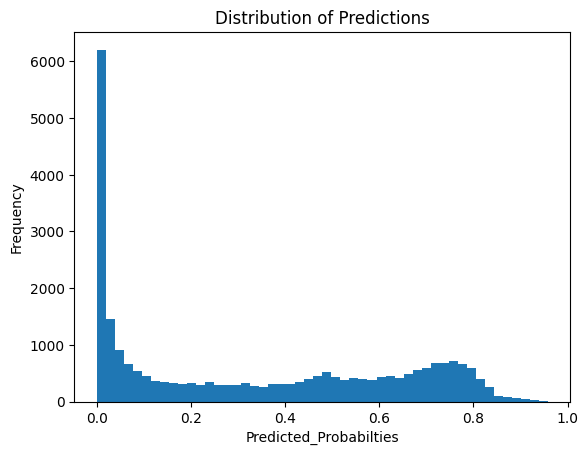

In [ ]:
preds = ann_class.predict(x_class_test)
plt.hist(preds, bins = 50)
plt.xlabel('Predicted_Probabilties')
plt.ylabel('Frequency')
plt.title('Distribution of Predictions')
plt.show()

In [ ]:
#WHY USE CLASS WEIGHTS ???????????????????????????///


#------------------


# using class weights to address the high imbalance and skewness in the target variable,
# ensuring the model does not bias towards the majority class and improves overall generalization.


#CLASSIFICATION USING CLASS WEIGHTS

#Setting the correct class weights in the imbalanced dataset

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
# Compute class weights for imbalanced dataset
classes = np.unique(y_class_train)
class_weights = compute_class_weight('balanced', classes=classes, y=y_class_train)
class_weight_dict = {i: class_weights[i] for i in range(len(classes))}


#Deploying classical_models_with_optimised_class_weights

In [ ]:

# Updated models with class_weight parameter where applicable
models_to_be_deployed = {
    'LOGISTIC REGRESSION': LogisticRegression(class_weight='balanced'),
    'DECISION TREE CLASSIFIER': DecisionTreeClassifier(criterion='entropy', random_state=40, class_weight='balanced'),
    'RANDOM FOREST CLASSIFIER': RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=70, class_weight='balanced'),
    'GRADIENT BOOSTING CLASSIFIER': GradientBoostingClassifier(n_estimators=50, learning_rate=0.1, max_depth=3, subsample=0.8),
    'ADABOOST CLASSIFIER': AdaBoostClassifier(n_estimators=50, learning_rate=1.0),
    'EXTRA TREES CLASSIFIER': ExtraTreesClassifier(n_estimators=50, max_depth=None, min_samples_split=2, n_jobs=-1)
}

# Train and evaluate models
metrics_to_be_calculated = {}
for model_name, model in models_to_be_deployed.items():
    model.fit(x_class_train, y_class_train)
    y_predicted = model.predict(x_class_test)

    metrics_to_be_calculated[model_name] = {
        "accuracy_score": accuracy_score(y_class_test, y_predicted),
        "precision_score": precision_score(y_class_test, y_predicted, average='weighted'),
        "f1_score": f1_score(y_class_test, y_predicted, average='weighted'),
        "recall_score": recall_score(y_class_test, y_predicted, average='weighted')
    }

    metrics_df = pd.DataFrame.from_dict(metrics_to_be_calculated, orient='index')



#The Precision_score, F1_score and Recall_score are 'weighted averages'.


#Evaluating the classical_model_with_optimised_class_weights

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
print(metrics_df)

                              accuracy_score  precision_score  f1_score  recall_score
LOGISTIC REGRESSION                 0.647878         0.986653  0.775909      0.647878
DECISION TREE CLASSIFIER            0.979413         0.979484  0.979449      0.979413
RANDOM FOREST CLASSIFIER            0.989247         0.986202  0.984264      0.989247
GRADIENT BOOSTING CLASSIFIER        0.988979         0.978306  0.983614      0.988979
ADABOOST CLASSIFIER                 0.989094         0.978307  0.983671      0.989094
EXTRA TREES CLASSIFIER              0.989247         0.985876  0.984334      0.989247


#Deploying Artificial_neural_network_with_optimised_class_weights

In [ ]:
# Optimized Artificial Neural Network (ANN) Model
ann_class = tf.keras.models.Sequential()

# Input layer with 128 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=128, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())  # Normalizing activations
ann_class.add(tf.keras.layers.Dropout(0.3))  # Dropout to prevent overfitting

# Hidden layer with 64 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=64, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())  # Normalizing activations
ann_class.add(tf.keras.layers.Dropout(0.3))  # Dropout to prevent overfitting

# Hidden layer with 32 neurons and ReLU activation
ann_class.add(tf.keras.layers.Dense(units=32, activation='relu'))
ann_class.add(tf.keras.layers.BatchNormalization())


ann_class.add(tf.keras.layers.Dense(units=16, activation='relu'))


ann_class.add(tf.keras.layers.Dense(units=8, activation='relu'))

# Output layer with 1 neuron and Sigmoid activation (for binary classification)
ann_class.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Compile and train the model with class weights. 'Adam' optimizer and loss func = 'binary_crossentropy'.
ann_class.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with class weights to handle imbalance
ann_class.fit(x_class_train, y_class_train, batch_size=128, epochs=50, validation_data=(x_class_test, y_class_test), class_weight=class_weight_dict)


Epoch 1/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 14s 10ms/step - accuracy: 0.6808 - loss: 0.6440 - val_accuracy: 0.5383 - val_loss: 0.6470
Epoch 2/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.5939 - loss: 0.5638 - val_accuracy: 0.5755 - val_loss: 0.6034
Epoch 3/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.6183 - loss: 0.5322 - val_accuracy: 0.5385 - val_loss: 0.6841
Epoch 4/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.6160 - loss: 0.5181 - val_accuracy: 0.6440 - val_loss: 0.5721
Epoch 5/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6399 - loss: 0.5168 - val_accuracy: 0.6311 - val_loss: 0.5170
Epoch 6/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.6432 - loss: 0.5003 - val_accuracy: 0.6264 - val_loss: 0.5449
Epoch 7/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6592 - loss: 0.4987 - val_accuracy: 0.6808 - val_loss: 0.5025
Epoch 8/50
817/817 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.6707 - loss: 0.5035 - val_accuracy

In [ ]:
def find_best_threshold_f1(y_true, y_pred_probs):

    precisions, recalls, thresholds = precision_recall_curve(y_true, y_pred_probs)

    # Compute F1-scores for each threshold
    f1_scores = (2 * precisions * recalls) / (precisions + recalls + 1e-10)  # Avoid division by zero

    # Get the threshold corresponding to the best F1-score
    best_threshold = thresholds[np.argmax(f1_scores)]

    return best_threshold

y_pred_probs = ann_class.predict(x_class_test).flatten()  # Get probabilities for class 1

# Find the best threshold based on F1-score
optimal_threshold = find_best_threshold_f1(y_class_test, y_pred_probs)
print(f"OPTIMAL THRESHOLD (F1-based): {optimal_threshold:.4f}")

817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
OPTIMAL THRESHOLD (F1-based): 0.8714


In [ ]:
y_class_pred = (ann_class.predict(x_class_test) > optimal_threshold).astype(int)


817/817 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


#Evaluating the ANN_with_optimised_class_weights

In [ ]:
metrics_dict = {
    "accuracy_score": accuracy_score(y_class_test, y_class_pred),
    "precision_score": precision_score(y_class_test, y_class_pred, average = 'weighted'),
    "f1_score": f1_score(y_class_test, y_class_pred, average = 'weighted'),
    "recall_score": recall_score(y_class_test, y_class_pred, average = 'weighted')
}

# Print results
for metric, value in metrics_dict.items():
    print(f"{metric}: {value:.4f}")

accuracy_score: 0.9687
precision_score: 0.9808
f1_score: 0.9745
recall_score: 0.9687


817/817 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Text(0.5, 1.0, 'Distribution of Predictions')

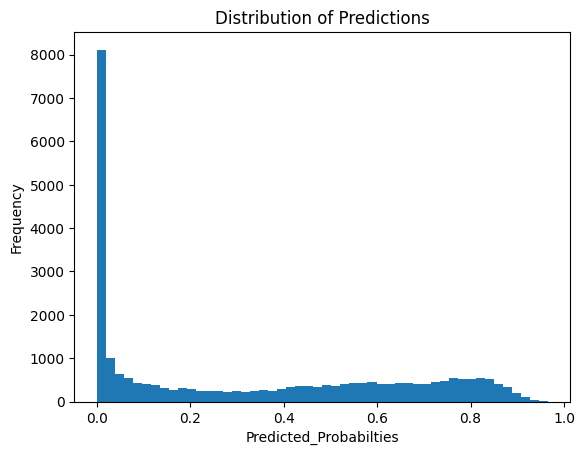

In [ ]:
preds = ann_class.predict(x_class_test)
plt.hist(preds, bins = 50)
plt.xlabel('Predicted_Probabilties')
plt.ylabel('Frequency')
plt.title('Distribution of Predictions')

In [ ]:
#the accuracy_score, precision_score, f1_score, recall_score all INCREASE post the application of class_weights

In [ ]:
#-----------------END-----------------------END---------------------------------------END--------------------------------END------------------------------END-----------------------------END----------------------------END---------------------------END------------------------